# UKBB application - education -> mediator -> g-factor
We consider several potential mediators
## Mediator = physical job

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')
sns.set_context('talk', font_scale=1.5)

In [2]:
nice_names_dict = \
{"coefficient_product"                   : "Coefficient product",
"mediation_g_computation_exp_forest"          : "G-computation (forest)",
"mediation_g_computation_exp_forest_cf"               : "G-computation (forest & cross-fitting)",
"mediation_g_computation_exp_noreg"                   : "G-computation (no regularization)",
"mediation_g_computation_exp_reg"                     : "G-computation (regularization)",
"mediation_g_computation_exp_reg_cf"                  : "G-computation (regularization & cross-fitting)",
"mediation_g_computation_imp_forest"          : "G-computation (forest)",
"mediation_g_computation_imp_forest_cf"               : "G-computation (forest & cross-fitting)",
"mediation_g_computation_imp_noreg"                   : "G-computation (no regularization)",
"mediation_g_computation_imp_reg"                     : "G-computation (regularization)",
"mediation_g_computation_imp_reg_cf"                  : "G-computation (regularization & cross-fitting)",
"mediation_ipw_forest"                      : "IPW (forest)",
"mediation_ipw_forest_cf"                   : "IPW (forest & cross-fitting)",
"mediation_ipw_noreg"                       : "IPW (no regularization)",
"mediation_ipw_reg"                         : "IPW (regularization)",
"mediation_ipw_reg_cf"                      : "IPW (regularization & cross-fitting)",
"mediation_multiply_robust_forest"                : "multiply robust (forest)",
"mediation_multiply_robust_forest_cf"             : "multiply robust (forest & cross-fitting)",
"mediation_multiply_robust_noreg"                 : "multiply robust (no regularization)",
"mediation_multiply_robust_reg"                   : "multiply robust (regularization)",
"mediation_multiply_robust_reg_cf"                : "multiply robust (regularization & cross-fitting)",
"mediation_DML_noreg"                   : "medDML (no regularization)",
"mediation_DML_reg"                     : "medDML (regularization)",
"mediation_DML_reg_cf"                  :  "medDML (regularization & cross-fitting)",
'mediation_DML_forest'                  : "medDML (forest)",
'mediation_DML_forest_cf'               : "medDML (forest & cross-fitting)",
'TMLE_forest'                           : 'TMLE (forest)',
 'TMLE_noreg'                           : 'TMLE (no regularization)',
 'TMLE_reg'                           : 'TMLE (regularization)',
}

In [22]:
sns.__version__

'0.12.2'

../results/20250315-Qualifications-2.0_1.0-smri-ncp2-g_factor.csv
../results/20250315-diabetic-smri-ncp2-g_factor.csv
../results/20250315-hypercholesterol-smri-ncp2-g_factor.csv
../results/20250315-hypertensive-smri-ncp2-g_factor.csv
../results/20250315-cMDD_final-smri-ncp2-g_factor.csv
../results/20250315-life_long_depression-smri-ncp2-g_factor.csv
../results/20250315-social_support-smri-ncp2-g_factor.csv
../results/20250315-inflammation-smri-ncp2-g_factor.csv
../results/20250315-current_smoker-smri-ncp2-g_factor.csv
../results/20250315-alcohol_above_nhs_reco-smri-ncp2-g_factor.csv
../results/20250315-obesity-smri-ncp2-g_factor.csv
../results/20250315-Qualifications-2.0_1.0-dmri-ncp2-g_factor.csv
../results/20250315-diabetic-dmri-ncp2-g_factor.csv
../results/20250315-hypercholesterol-dmri-ncp2-g_factor.csv
../results/20250315-hypertensive-dmri-ncp2-g_factor.csv
../results/20250315-cMDD_final-dmri-ncp2-g_factor.csv
../results/20250315-life_long_depression-dmri-ncp2-g_factor.csv
../resu

/Users/JudithAbecassis/miniconda3/envs/new_causal_37/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


../results/20250315-obesity-dmri-ncp2-g_factor.csv
../results/20250315-Qualifications-2.0_1.0-smri_dmri-ncp2-g_factor.csv
../results/20250315-diabetic-smri_dmri-ncp2-g_factor.csv
../results/20250315-hypercholesterol-smri_dmri-ncp2-g_factor.csv
../results/20250315-hypertensive-smri_dmri-ncp2-g_factor.csv
../results/20250315-cMDD_final-smri_dmri-ncp2-g_factor.csv
../results/20250315-life_long_depression-smri_dmri-ncp2-g_factor.csv
../results/20250315-social_support-smri_dmri-ncp2-g_factor.csv
../results/20250315-inflammation-smri_dmri-ncp2-g_factor.csv
../results/20250315-current_smoker-smri_dmri-ncp2-g_factor.csv
../results/20250315-alcohol_above_nhs_reco-smri_dmri-ncp2-g_factor.csv
../results/20250315-obesity-smri_dmri-ncp2-g_factor.csv
../results/20250315-Qualifications-2.0_1.0-smri-ncp5-g_factor.csv
../results/20250315-diabetic-smri-ncp5-g_factor.csv
../results/20250315-hypercholesterol-smri-ncp5-g_factor.csv
../results/20250315-hypertensive-smri-ncp5-g_factor.csv
../results/20250315

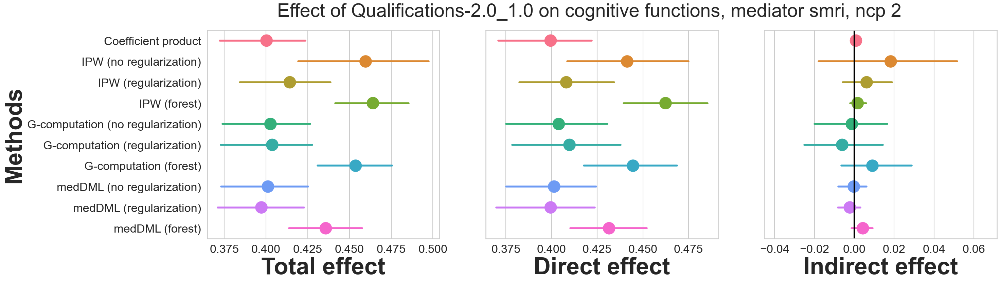

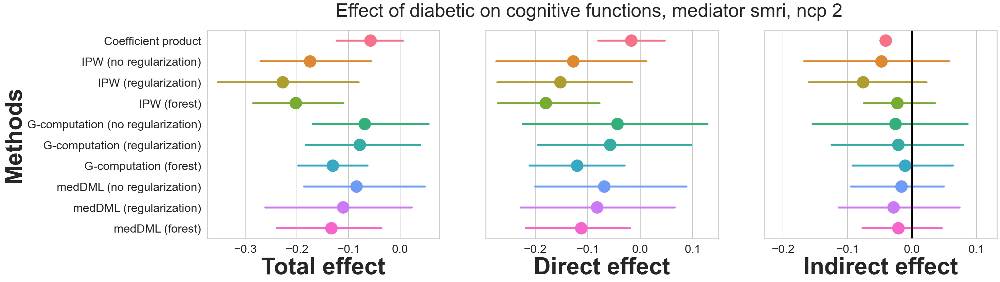

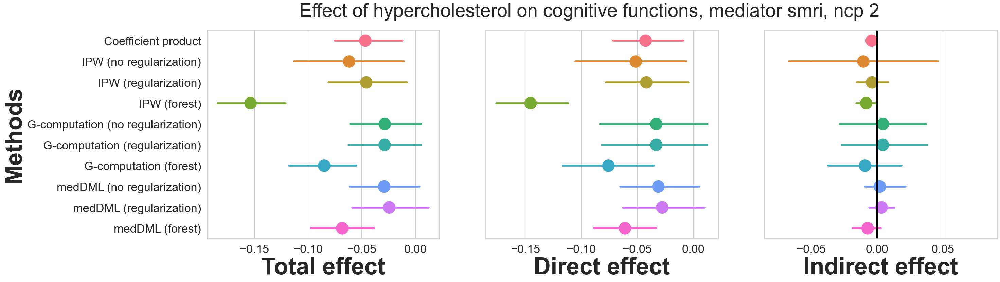

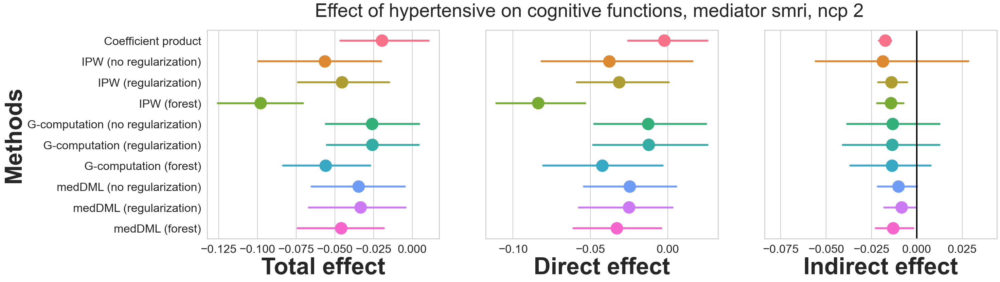

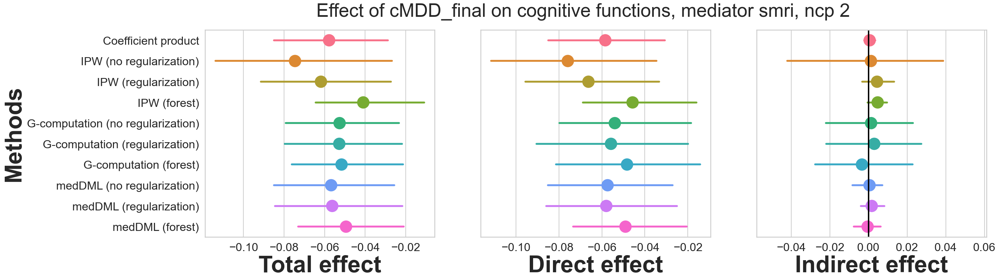

...

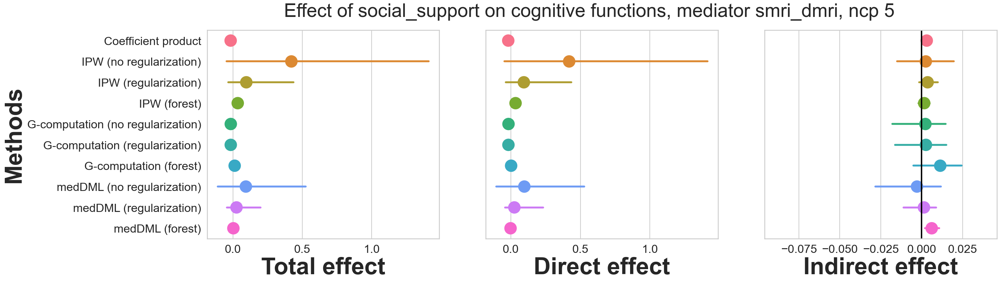

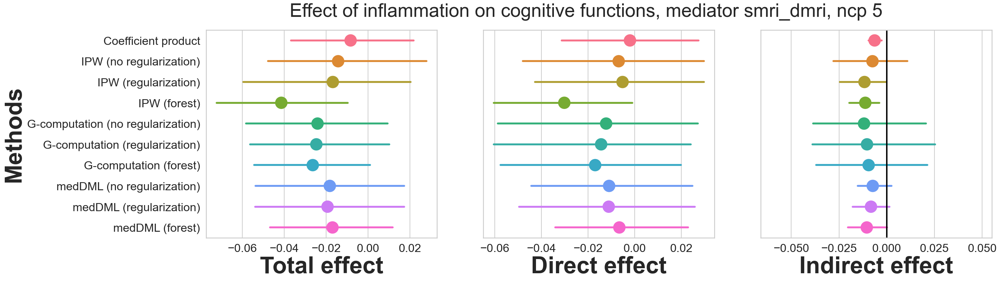

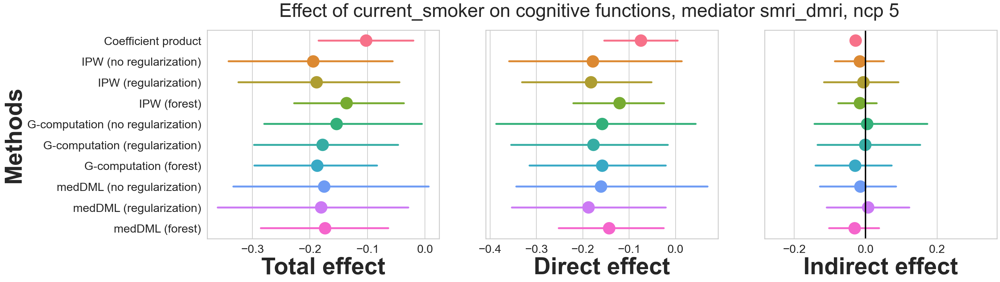

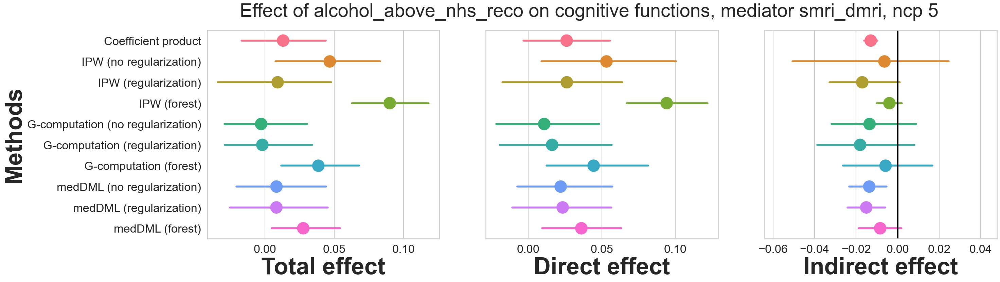

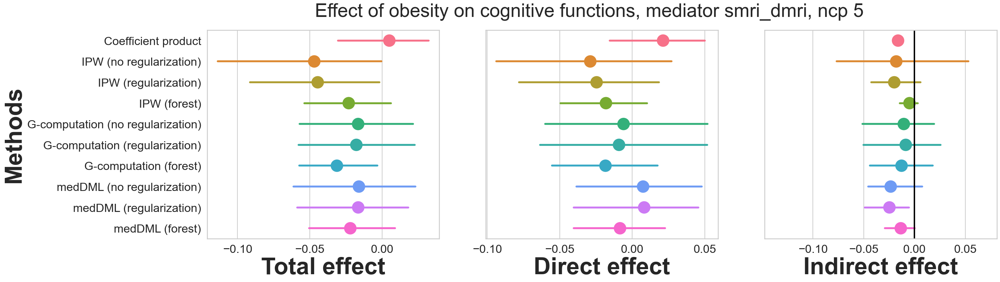

In [27]:
potential_treatments = ['Qualifications-2.0_1.0', # higher degree
                        'diabetic',
                        'hypercholesterol',
                        'hypertensive',
                        'cMDD_final', # current depression
                        'life_long_depression',
                        'social_support',
                        'inflammation',
                        'current_smoker',
                        #'current_never_smoker',
                        #'previous_never_smoker',
                        'alcohol_above_nhs_reco',
                        'obesity']

for pca_mental_health_lifestyle_ncp in [2, 5]:
    for mri_data_type in ['smri', 'dmri', 'smri_dmri']:
        for treatment_name in potential_treatments:
            print('../results/20250315-{}-{}-ncp{}-g_factor.csv'.format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp))
            df = pd.read_csv('../results/20250315-{}-{}-ncp{}-g_factor.csv'.format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp),
                 sep='\t',
                 header=0,
                names=['estimator', 'total_effect', 'direct_treated_effect', 'direct_control_effect',
               'indirect_treated_effect', 'indirect_control_effect'])
            df = df.assign(nice_estimator=df.estimator.map(nice_names_dict))
            fig, ax = plt.subplots(ncols=3, figsize=(30, 8))
            effect_names = ['total_effect', 'direct_control_effect', 'indirect_treated_effect']
            df = df.assign(total_effect=-df.total_effect)
            df = df.assign(indirect_treated_effect=-df.indirect_treated_effect)
            df = df.assign(direct_control_effect=-df.direct_control_effect)
            df = df[~df.estimator.str.contains('multiply')]

            df = df.assign(nice_estimator = df.nice_estimator.str.replace(' & cross-fitting', ''))
            for i in range(3):
                sns.pointplot(y='nice_estimator', x=effect_names[i], data=df, orient='h', ax=ax[i],
                              errorbar=('pi', 95), linestyles="none", scale=2, palette=sns.color_palette("husl", 10))
                ax[i].set_ylabel('')
                ax[i].set_xlabel(ax[i].get_xlabel().replace('_', ' '))
            ax[2].axvline(x=0, lw=3, color='k')
            ax[2].set_xlim([min(-0.02, df[~df.estimator.isin(['multiply_robust_noreg_cf', 'DML_huber'])][[effect_names[i]]].min().values[0]-0.01),
                           df[~df.estimator.isin(['multiply_robust_noreg_cf', 'DML_huber'])][[effect_names[i]]].max().values[0]+0.01])

            ax[1].set(yticklabels=[])
            ax[2].set(yticklabels=[])
            ax[0].set_ylabel('Methods', fontsize=50, weight='bold')
            ax[0].set_xlabel('Total effect', fontsize=50, weight='bold')
            ax[1].set_xlabel('Direct effect', fontsize=50, weight='bold')
            ax[2].set_xlabel('Indirect effect', fontsize=50, weight='bold')
            fig.suptitle("Effect of {} on cognitive functions, mediator {}, ncp {}".format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp), fontsize=40)
            plt.savefig('../results/figures_2025/{}-{}-ncp{}-g_factor.pdf'.format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp), bbox_inches='tight')
            

In [4]:
potential_treatments = ['Qualifications-2.0_1.0', # higher degree
                        'diabetic',
                        'hypercholesterol',
                        'hypertensive',
                        'cMDD_final', # current depression
                        'life_long_depression',
                        'social_support',
                        'inflammation',
                        'current_smoker',
                        #'current_never_smoker',
                        #'previous_never_smoker',
                        'alcohol_above_nhs_reco',
                        'obesity']

exposure_dict={'Qualifications': 'college degree',
               'diabetic': 'diabetes',
               'hypercholesterol': 'hypercholesterol',
               'hypertensive': 'hypertension',
               'cMDD_final': 'recent depression',
               'life_long_depression': 'life long depression',
               'social_support': 'social support',
               'inflammation': 'inflammation',
               'current_smoker': 'current smoker',
               'alcohol_above_nhs_reco': 'high alcohol consumption',
               'obesity': 'obesity'}
for pca_mental_health_lifestyle_ncp in [2, 5]:
    for mri_data_type in ['smri', 'dmri', 'smri_dmri']:
        res_list = list()
        for treatment_name in potential_treatments:
            print('../results/20250315-{}-{}-ncp{}-g_factor.csv'.format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp))
            df = pd.read_csv('../results/20250315-{}-{}-ncp{}-g_factor.csv'.format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp),
                 sep='\t',
                 header=0,
                names=['estimator', 'total_effect', 'direct_treated_effect', 'direct_control_effect',
               'indirect_treated_effect', 'indirect_control_effect'])
            df = df.assign(nice_estimator=df.estimator.map(nice_names_dict))
            #fig, ax = plt.subplots(ncols=3, figsize=(30, 8))
            effect_names = ['total_effect', 'direct_control_effect', 'indirect_treated_effect']

            df = df.assign(nice_estimator = df.nice_estimator.str.replace(' & cross-fitting', ''))
            df = df.assign(treatment=treatment_name.split('-')[0])
            res_list.append(df)
            
        big_df = pd.concat(res_list, axis=0)
        big_df = big_df.assign(mediated_proportion=big_df.indirect_treated_effect/big_df.total_effect)
        big_df = big_df.assign(nice_treatment=big_df.treatment.map(exposure_dict))
        fig, ax = plt.subplots(ncols=2, figsize=(20, 8))
        sns.boxplot(y='nice_treatment', x='total_effect', data=big_df[big_df.nice_estimator=='Coefficient product'], orient='h', ax=ax[0], showfliers = False)
        sns.pointplot(y='nice_treatment', x='indirect_treated_effect', data=big_df[big_df.nice_estimator=='Coefficient product'], orient='h', ax=ax[0], join = False, color='black', estimator=np.median)

        ax[0].set_ylabel('exposure', fontsize=50, weight='bold')
        ax[0].set_xlabel('Total effect', fontsize=50, weight='bold')
        ax[0].axvline(x=0, lw=3, color='k')
        ax[1].axvline(x=0, lw=3, color='k', ls='dotted')                                                       
        sns.boxplot(y='nice_treatment', x='indirect_treated_effect', data=big_df[big_df.nice_estimator=='Coefficient product'], orient='h', ax=ax[1], showfliers = False)
        ax[1].set_ylabel('')
        ax[1].set_xlabel('Indirect effect', fontsize=50, weight='bold')
        ax[1].set(yticklabels=[])
        plt.savefig('../results/figures_2025/20250315_all_exposures_ncp{}_mediator_{}_coef.pdf'.format(pca_mental_health_lifestyle_ncp, mri_data_type), bbox_inches='tight')
        plt.savefig('../results/figures_2025/20250315_all_exposures_ncp{}_mediator_{}_coef.png'.format(pca_mental_health_lifestyle_ncp, mri_data_type), bbox_inches='tight', dpi=400)                                            
        plt.close()

../results/20250315-Qualifications-2.0_1.0-smri-ncp2-g_factor.csv
../results/20250315-diabetic-smri-ncp2-g_factor.csv
../results/20250315-hypercholesterol-smri-ncp2-g_factor.csv
../results/20250315-hypertensive-smri-ncp2-g_factor.csv
../results/20250315-cMDD_final-smri-ncp2-g_factor.csv
../results/20250315-life_long_depression-smri-ncp2-g_factor.csv
../results/20250315-social_support-smri-ncp2-g_factor.csv
../results/20250315-inflammation-smri-ncp2-g_factor.csv
../results/20250315-current_smoker-smri-ncp2-g_factor.csv
../results/20250315-alcohol_above_nhs_reco-smri-ncp2-g_factor.csv
../results/20250315-obesity-smri-ncp2-g_factor.csv
../results/20250315-Qualifications-2.0_1.0-dmri-ncp2-g_factor.csv
../results/20250315-diabetic-dmri-ncp2-g_factor.csv
../results/20250315-hypercholesterol-dmri-ncp2-g_factor.csv
../results/20250315-hypertensive-dmri-ncp2-g_factor.csv
../results/20250315-cMDD_final-dmri-ncp2-g_factor.csv
../results/20250315-life_long_depression-dmri-ncp2-g_factor.csv
../resu

In [17]:
potential_treatments = ['Qualifications-2.0_1.0', # higher degree
                        'diabetic',
                        'hypercholesterol',
                        'hypertensive',
                        'cMDD_final', # current depression
                        'life_long_depression',
                        'social_support',
                        'inflammation',
                        'current_smoker',
                        #'current_never_smoker',
                        #'previous_never_smoker',
                        'alcohol_above_nhs_reco',
                        'obesity']

exposure_dict={'Qualifications': 'college degree',
               'diabetic': 'diabetes',
               'hypercholesterol': 'hypercholesterol',
               'hypertensive': 'hypertension',
               'cMDD_final': 'recent depression',
               'life_long_depression': 'life long depression',
               'social_support': 'social support',
               'inflammation': 'inflammation',
               'current_smoker': 'current smoker',
               'alcohol_above_nhs_reco': 'high alcohol consumption',
               'obesity': 'obesity'}
for pca_mental_health_lifestyle_ncp in [2, 5]:
    for mri_data_type in ['smri', 'dmri', 'smri_dmri']:
        res_list = list()
        for treatment_name in potential_treatments:
            print('../results/20250315-{}-{}-ncp{}-g_factor.csv'.format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp))
            df = pd.read_csv('../results/20250315-{}-{}-ncp{}-g_factor.csv'.format(treatment_name, mri_data_type, pca_mental_health_lifestyle_ncp),
                 sep='\t',
                 header=0,
                names=['estimator', 'total_effect', 'direct_treated_effect', 'direct_control_effect',
               'indirect_treated_effect', 'indirect_control_effect'])
            df = df.assign(nice_estimator=df.estimator.map(nice_names_dict))
            #fig, ax = plt.subplots(ncols=3, figsize=(30, 8))
            effect_names = ['total_effect', 'direct_control_effect', 'indirect_treated_effect']

            df = df.assign(nice_estimator = df.nice_estimator.str.replace(' & cross-fitting', ''))
            df = df.assign(treatment=treatment_name.split('-')[0])
            res_list.append(df)
            
        big_df = pd.concat(res_list, axis=0)
        big_df = big_df.assign(mediated_proportion=big_df.indirect_treated_effect/big_df.total_effect)
        big_df = big_df.assign(nice_treatment=big_df.treatment.map(exposure_dict))
        fig, ax = plt.subplots(ncols=2, figsize=(20, 8))
        sns.boxplot(y='nice_treatment', x='total_effect', data=big_df[big_df.nice_estimator=="medDML (no regularization)"], orient='h', ax=ax[0], showfliers = False)
        sns.pointplot(y='nice_treatment', x='indirect_treated_effect', data=big_df[big_df.nice_estimator=="medDML (no regularization)"], orient='h', ax=ax[0], join = False, color='black', estimator=np.median)

        ax[0].set_ylabel('exposure', fontsize=50, weight='bold')
        ax[0].set_xlabel('Total effect', fontsize=50, weight='bold')
        ax[0].axvline(x=0, lw=3, color='k')
        ax[1].axvline(x=0, lw=3, color='k', ls='dotted')                                                       
        sns.boxplot(y='nice_treatment', x='indirect_treated_effect', data=big_df[big_df.nice_estimator=="medDML (no regularization)"], orient='h', ax=ax[1], showfliers = False)
        ax[1].set_ylabel('')
        ax[1].set_xlabel('Indirect effect', fontsize=50, weight='bold')
        ax[1].set(yticklabels=[])
        plt.savefig('../results/figures_2025/20250315_all_exposures_ncp{}_mediator_{}_dml.pdf'.format(pca_mental_health_lifestyle_ncp, mri_data_type), bbox_inches='tight')
        plt.savefig('../results/figures_2025/20250315_all_exposures_ncp{}_mediator_{}_dml.png'.format(pca_mental_health_lifestyle_ncp, mri_data_type), bbox_inches='tight', dpi=400)                                            
        plt.close()

../results/20250315-Qualifications-2.0_1.0-smri-ncp2-g_factor.csv
../results/20250315-diabetic-smri-ncp2-g_factor.csv
../results/20250315-hypercholesterol-smri-ncp2-g_factor.csv
../results/20250315-hypertensive-smri-ncp2-g_factor.csv
../results/20250315-cMDD_final-smri-ncp2-g_factor.csv
../results/20250315-life_long_depression-smri-ncp2-g_factor.csv
../results/20250315-social_support-smri-ncp2-g_factor.csv
../results/20250315-inflammation-smri-ncp2-g_factor.csv
../results/20250315-current_smoker-smri-ncp2-g_factor.csv
../results/20250315-alcohol_above_nhs_reco-smri-ncp2-g_factor.csv
../results/20250315-obesity-smri-ncp2-g_factor.csv
../results/20250315-Qualifications-2.0_1.0-dmri-ncp2-g_factor.csv
../results/20250315-diabetic-dmri-ncp2-g_factor.csv
../results/20250315-hypercholesterol-dmri-ncp2-g_factor.csv
../results/20250315-hypertensive-dmri-ncp2-g_factor.csv
../results/20250315-cMDD_final-dmri-ncp2-g_factor.csv
../results/20250315-life_long_depression-dmri-ncp2-g_factor.csv
../resu